In [2]:
# !pip install roboflow

# from roboflow import Roboflow
# rf = Roboflow(api_key="qaS9gnOnb4ZZNwsCCKRk")
# project = rf.workspace("kitchenobjectdetection").project("classification-dl4jt")
# dataset = project.version(1).download("multiclass")

In [79]:
from sagemaker.tensorflow import TensorFlow
from keras.preprocessing import image
import numpy as np
import pandas as pd
import sagemaker
import time

In [2]:
train = pd.read_csv('classification-1/train/train-classes.csv')

In [3]:
sess = sagemaker.Session()
role = sagemaker.get_execution_role()

In [4]:
# prefix = 'multi-label-classification'
# training_input_path   = sess.upload_data('./classification-1', key_prefix=prefix+'/training')
# validation_input_path = sess.upload_data('./data/testing', key_prefix=prefix+'/validation')

In [5]:
# print(training_input_path)
training_input_path = 's3://sagemaker-us-west-2-539965572043/multi-label-classification/training'

In [6]:
 !pygmentize src/train.py

from sklearn.model_selection import train_test_split
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras.preprocessing import image
from keras.models import Sequential
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
import argparse, os
import pandas as pd
import numpy as np
import keras


if __name__ == '__main__':
    parser = argparse.ArgumentParser()


    parser.add_argument('--model-dir', type=str, default=os.environ['SM_MODEL_DIR'])
    parser.add_argument('--training', type=str, default=os.environ['SM_CHANNEL_TRAINING'])
    parser.add_argument('--epochs', type=int, default=1)
    parser.add_argument('--batch-size', type=int, default=128)
    
    args, _ = parser.parse_known_args()
    epochs     = args.epochs
    batch_size = args.batch_size
    model_dir  = args.model_dir
    training_dir   = args.training
    
    train = pd.read_csv(os.path.join(trainin

In [7]:
# install dependecies in tensorflow container.
env = {
    'SAGEMAKER_REQUIREMENTS': 'requirements.txt', # path relative to `source_dir` below.
}

#hyperperameter tuining
hyperparameters={'epochs': 10,
                 'batch-size': 32} 

simple_tf_estimator = TensorFlow(entry_point='train.py',
                          source_dir='src',
                          role=role,
                          instance_count=1, 
                          instance_type='ml.m5.4xlarge',     # $0.922 per hours
                          framework_version='2.3', 
                          py_version='py37',
                          script_mode=True,
                          hyperparameters = hyperparameters)

In [8]:
simple_tf_estimator.hyperparameters()

{'epochs': '10', 'batch-size': '32', 'model_dir': 'null'}

In [9]:
simple_tf_estimator.fit(training_input_path)

2022-06-08 08:38:42 Starting - Starting the training job...
2022-06-08 08:38:58 Starting - Preparing the instances for trainingProfilerReport-1654677521: InProgress
......
2022-06-08 08:40:05 Downloading - Downloading input data...
2022-06-08 08:40:25 Training - Downloading the training image...
2022-06-08 08:41:05 Training - Training image download completed. Training in progress.2022-06-08 08:40:56.679973: W tensorflow/core/profiler/internal/smprofiler_timeline.cc:460] Initializing the SageMaker Profiler.
2022-06-08 08:40:56.684332: W tensorflow/core/profiler/internal/smprofiler_timeline.cc:105] SageMaker Profiler is not enabled. The timeline writer thread will not be started, future recorded events will be dropped.
2022-06-08 08:40:56.833648: W tensorflow/core/profiler/internal/smprofiler_timeline.cc:460] Initializing the SageMaker Profiler.
2022-06-08 08:40:59,615 sagemaker-training-toolkit INFO     Imported framework sagemaker_tensorflow_container.training
2022-06-08 08:40:59,623 

# Deploy model in prodection

In [10]:
tf_endpoint_name = 'kitchen-classification-model-'+time.strftime("%Y-%m-%d-%H-%M-%S", time.gmtime())

#tf_predictor = tf_estimator.deploy(initial_instance_count=1,
#                                   instance_type='ml.p2.xlarge')      # $1.361/hour 

tf_predictor = simple_tf_estimator.deploy(initial_instance_count=1,
                                   instance_type='ml.m5.large',        # $0.115/hour 
                                   endpoint_name=tf_endpoint_name) 

update_endpoint is a no-op in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


----!

# Pridection

In [15]:
# !wget https://airforshare.com/files/UUkBjZ.jpg

--2022-06-07 16:23:21--  https://airforshare.com/files/UUkBjZ.jpg
Resolving airforshare.com (airforshare.com)... 178.79.152.228, 2a01:7e00::f03c:91ff:fe50:cead
Connecting to airforshare.com (airforshare.com)|178.79.152.228|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: http://www.airforshare.com/notfound.php [following]
--2022-06-07 16:23:22--  http://www.airforshare.com/notfound.php
Resolving www.airforshare.com (www.airforshare.com)... 178.79.152.228, 2a01:7e00::f03c:91ff:fe50:cead
Connecting to www.airforshare.com (www.airforshare.com)|178.79.152.228|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.airforshare.com/notfound.php [following]
--2022-06-07 16:23:23--  https://www.airforshare.com/notfound.php
Connecting to www.airforshare.com (www.airforshare.com)|178.79.152.228|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7711 (7.5K) [text/html]
Saving to: ‘UUkBjZ.jpg.1’

UUk

In [100]:
img = image.load_img('classification-1/test/americankitchendesignwithcountertypeapplinces84_jpeg.rf.c771ba14ba71cd549b8c73d24bf23fb0.jpg',target_size=(400,400,3))
img = image.img_to_array(img)
img = img/255

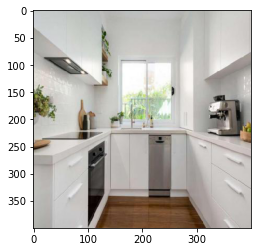

In [101]:
plt.imshow(img)

In [103]:
classes = np.array(train.columns[2:])
proba = tf_predictor.predict(img.reshape(1,400,400,3))
proba = list(proba.values())
proba = np.array(proba)
# print(proba.shape)
proba = proba.reshape(1, 16)
top_3 = np.argsort(proba[0])[:-11:-1]
for i in range(10):
    print("{}".format(classes[top_3[i]])+" ({:.3})".format(proba[0][top_3[i]]))

print(proba)
plt.imshow(img)

 countertopwood (0.648)
 spoon (0.607)
 plate (0.402)
 wineglass (0.374)
 oven (0.29)
 sink (0.265)
 countertopstone (0.255)
 microwave (0.254)
 cup (0.187)
 refrigerator (0.133)
[[0.05649039 0.07780945 0.25508839 0.64812958 0.18657002 0.11862132
  0.04631424 0.25377357 0.2903586  0.402042   0.13273829 0.26532149
  0.606777   0.06122801 0.37410602 0.11372095]]


# delete endpoint

In [104]:
 sess.delete_endpoint(endpoint_name=tf_endpoint_name)

# Finetune methord

In [111]:
 !pygmentize src/Finetune-train.py

from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from sklearn.model_selection import train_test_split
from keras.layers import Dense, Dropout, Flatten
from keras.utils import to_categorical
from keras.preprocessing import image
from keras.models import Sequential
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
import argparse, os
import pandas as pd
import numpy as np
import keras


if __name__ == '__main__':
    parser = argparse.ArgumentParser()


    parser.add_argument('--model-dir', type=str, default=os.environ['SM_MODEL_DIR'])
    parser.add_argument('--training', type=str, default=os.environ['SM_CHANNEL_TRAINING'])
    parser.add_argument('--epochs', type=int, default=10)
    parser.add_argument('--batch-size', type=int, default=16)
    
    args, _ = parser.parse_known_args()
    epochs     = args.epochs
    batch_size = args.batch_size
    model_dir  = args.model_dir
    training_dir   = args.training
    
    train = pd.read_

In [112]:
from sagemaker.tensorflow import TensorFlow

env = {
    'SAGEMAKER_REQUIREMENTS': 'requirements.txt', # path relative to `source_dir` below.
}

hyperparameters={'epochs': 20,
                 'batch-size': 32} 

finetune_tf_estimator = TensorFlow(entry_point = 'Finetune-train.py',
                          source_dir = 'src',
                          role = role,
                          instance_count = 1, 
                          instance_type = 'ml.m5.4xlarge',      # $0.922 per hours
                          framework_version = '2.3', 
                          py_version = 'py37',
                          script_mode=True,
                          hyperparameters = hyperparameters)

In [113]:
finetune_tf_estimator.hyperparameters()

{'epochs': '20', 'batch-size': '32', 'model_dir': 'null'}

In [114]:
finetune_tf_estimator.fit(training_input_path)

2022-06-08 10:23:28 Starting - Starting the training job...
2022-06-08 10:23:52 Starting - Preparing the instances for trainingProfilerReport-1654683808: InProgress
......
2022-06-08 10:24:53 Downloading - Downloading input data...
2022-06-08 10:25:13 Training - Downloading the training image..2022-06-08 10:25:35.000358: W tensorflow/core/profiler/internal/smprofiler_timeline.cc:460] Initializing the SageMaker Profiler.
2022-06-08 10:25:35.004526: W tensorflow/core/profiler/internal/smprofiler_timeline.cc:105] SageMaker Profiler is not enabled. The timeline writer thread will not be started, future recorded events will be dropped.
2022-06-08 10:25:35.174722: W tensorflow/core/profiler/internal/smprofiler_timeline.cc:460] Initializing the SageMaker Profiler.
2022-06-08 10:25:37,811 sagemaker-training-toolkit INFO     Imported framework sagemaker_tensorflow_container.training
2022-06-08 10:25:37,819 sagemaker-training-toolkit INFO     No GPUs detected (normal if no gpus installed)
2022-0

# Finetune model deployment in prodection.

In [119]:
# create endpoint to deploy in prodection
finetune_tf_endpoint_name = 'kitchen-classification-model-'+time.strftime("%Y-%m-%d-%H-%M-%S", time.gmtime())

#tf_predictor = tf_estimator.deploy(initial_instance_count=1,
#      instance_type='ml.p2.xlarge')      # $1.361/hour 

# define instance type
finetune_tf_predictor = tf_estimator.deploy(initial_instance_count=1,
                                                     instance_type='ml.m5.large',        # $0.115/hour 
                                                     endpoint_name=finetune_tf_endpoint_name) 

update_endpoint is a no-op in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


----!

# prediction

In [131]:
#  load testing image
# convert into model read able formate
img = image.load_img('classification-1/test/americankitchendesign28_jpeg.rf.95e4eccd02a8f2f79ecd5785947f09f1.jpg',target_size=(400,400,3))
img = image.img_to_array(img)
img = img/255

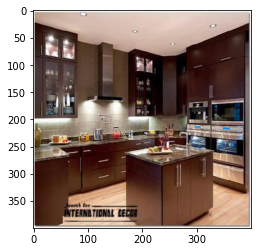

In [132]:
# show image
plt.imshow(img)

In [135]:
# show predected classes and confidence score
classes = np.array(train.columns[2:])
proba = finetune_tf_predictor.predict(img.reshape(1,400,400,3))
proba = list(proba.values())
proba = np.array(proba)
# print(proba.shape)
proba = proba.reshape(1, 16)
top_3 = np.argsort(proba[0])[:-5:-1]
for i in range(4):
    print("{}".format(classes[top_3[i]])+" ({:.3})".format(proba[0][top_3[i]]))

print(proba)


 spoon (0.787)
 countertopwood (0.72)
 wineglass (0.687)
 oven (0.541)
[[0.15363193 0.15048188 0.45910227 0.71982378 0.16641906 0.40934494
  0.10425669 0.23862198 0.54106557 0.32195726 0.29402912 0.24993047
  0.78660995 0.17097935 0.68650645 0.44057745]]


# delete endpoint

In [136]:
 sess.delete_endpoint(endpoint_name=finetune_tf_endpoint_name)